<a href="https://colab.research.google.com/github/kcambrek/Style-Transfer/blob/master/Style_Transfer_content_layers_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Style transfer

The code below is adapted from the [style transfer notebook ](https://colab.research.google.com/github/tensorflow/lucid/blob/master/notebooks/differentiable-parameterizations/style_transfer_2d.ipynb#scrollTo=JndnmDMp66FL) by Google, which has been made available under the Apache License, Version 2.0. In the Google notebook, neural style transfer is explained step by step.

One reason I modified their code in one single class is that is easier to work with if your not that much interested in the inner workings of style transfer and just want to have results quickly.

Another change I made is that the class will iterate on the first 12 layers of the pre-trained image classifier to serve as content layer. What I have found is that for input different images and different esthetic goals, different layers are more suitable. However, this can only be judged by the person trying to obtain stylised pictures.

Some of the best examples:

Amsterdam + Milliners - Picasso : mixed3a

![picture](https://drive.google.com/uc?id=1-kG4M-pZhHV8ZdByQHV-ottap1EEBaQ3)
![picture](https://drive.google.com/uc?id=1oPBgSOwLMhiCeXlZ7wguL9aSYeg_Ieqf)

![picture](https://drive.google.com/uc?id=12Ds2Z9PthtnjydPhkb_VDOdJysSwah19)

Bridge + Red Vineyards at Arles - Van Gogh : mixed4b.png

![picture](https://drive.google.com/uc?id=1-Ps6IiuFCVyEFRSSTeRXXHZtaXzJveGd)
![picture](https://drive.google.com/uc?id=1q7JQJvGeAq7PsOm8pOojjn1aHmBJm10X)

![picture](https://drive.google.com/uc?id=12N2zMl4TSbvsAjwJI8Ry72MkD1O22el8)

Giraffe + The Persistence of Memory - Dali : mixed4a

![picture](https://drive.google.com/uc?id=1-a_eBH76_p3szGn-Ij8bEWKoZ4G5-etq)
![picture](https://drive.google.com/uc?id=1ho2ZcHMfDK3CSMNAOrPuykoKFPIts0Bh)

![picture](https://drive.google.com/uc?id=16B9sOJ8aF_auEfo1VPyK7uyIJ0M_zytB)

Lion + Cubist Self-portrait - Dali : conv2d2

![picture](https://drive.google.com/uc?id=1-l89_olobGCJcjW2cHQ4Yxr7AvRI8M4K)
![picture](https://drive.google.com/uc?id=1GMmver5MSbROJYj2l3btMeKki5lFIDFA)

![picture](https://drive.google.com/uc?id=10KClA0odnHhO4f0lM3ap8Kvj05_LunzF)


Mountain + The Starry Night - Van Gogh : conv2d2

![picture](https://drive.google.com/uc?id=1-LBhftRMQDiTNufN6nmd84EGhZdA7BWj)
![picture](https://drive.google.com/uc?id=1vG2W5nnxPrEmIFnPNaWjLz7eg_tvOKMk)

![picture](https://drive.google.com/uc?id=1-OB0Wj4JkU541JsMDdQ7Zhlf3OpRpL6e)

Roses + Composition VI - Kandinsky : mixed4a

![picture](https://drive.google.com/uc?id=1-XOIrYUUwU2im6pVfdoILVzso9MuQN4g)
![picture](https://drive.google.com/uc?id=1-KD-QjWNtUFQKog4lx9LPdaVZbhSQ2Bw)

![picture](https://drive.google.com/uc?id=14HwWItg6jWIXOyobknaridNe0cjnX42M)!




#Prerequisites

In [0]:
from google.colab import drive
drive.mount('/gdrive')
#advised is to have a folder in your drive named "Images" to store all the images.

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /gdrive


In [0]:
!pip install -q lucid>=0.2.3

%tensorflow_version 1.x
import numpy as np
import tensorflow as tf

from lucid.modelzoo import vision_models
from lucid.misc.io import show, load, save
from lucid.misc.tfutil import create_session

import lucid.optvis.objectives as objectives
import lucid.optvis.param as param
import lucid.optvis.render as render

from lucid.optvis.objectives import wrap_objective

import cv2
from PIL import Image
import pickle
import matplotlib.pyplot as plt

import os

TensorFlow 1.x selected.


#Style transfer class

I tried varying the layers that are used for the style layers, however, I did not observe major esthetic improvements compared to the layers being suggested in the original notebook by Google.

The class uses the Inception V1 models as default. The results of this model seem to be esthetically pleasing enough, thus I saw no reason to try other models. Lucid contains other pre-trained image recogntiion models, so trying other models and comparing results might be a good next step in exploring neural style transfer. 


In [0]:

class Style_transfer():
  def __init__(self):
    #load model with pre-trained weights.
    self.model = vision_models.InceptionV1()
    self.model.load_graphdef()
    #indices to keep track of the images in the input and output.
    self.TRANSFER_INDEX = 0
    self.CONTENT_INDEX = 1
    self.STYLE_INDEX = 2
    #get layer names to iterate over for the content layer
    self.multiple_content_layers = [[layer.name] for layer in self.model.layers][:12]
    self.style_layers = ['conv2d2','mixed3a','mixed4a','mixed4b','mixed4c']

  def style_transfer_param(self, content_image, style_image, decorrelate=True, fft=True):
    style_transfer_input = param.image(*content_image.shape[:2], decorrelate=decorrelate, fft=fft)[0]
    content_input = content_image
    style_input = tf.random_crop(style_image, content_image.shape)
    return tf.stack([style_transfer_input, content_input, style_input])

  def mean_L1(self, a, b):
    return tf.reduce_mean(tf.abs(a-b))

  @wrap_objective
  def activation_difference(self, layer_names, difference_to, transform_f=None):
    def inner(T):
      # first we collect the (constant) activations of image we're computing the difference to
      image_activations = [T(layer_name)[difference_to] for layer_name in layer_names]
      if transform_f is not None:
        image_activations = [transform_f(act) for act in image_activations]

      # we also set get the activations of the optimized image which will change during optimization
      optimization_activations = [T(layer)[self.TRANSFER_INDEX] for layer in layer_names]
      if transform_f is not None:
        optimization_activations = [transform_f(act) for act in optimization_activations]

      # we use the supplied loss function to compute the actual losses
      losses = [self.mean_L1(a, b) for a, b in zip(image_activations, optimization_activations)]
      return tf.add_n(losses)

    return inner

  def gram_matrix(self, array, normalize_magnitue=True):
    channels = tf.shape(array)[-1]
    array_flat = tf.reshape(array, [-1, channels])
    gram_matrix = tf.matmul(array_flat, array_flat, transpose_a=True)
    if normalize_magnitue:
      length = tf.shape(array_flat)[0]
      gram_matrix /= tf.cast(length, tf.float32)
    return gram_matrix  

  def transfer(self, content_image, style_image):
    '''Accepts two RGB images which are formatted as numpy arrays with size (3, 512, 512).
    Returns a dictionary with 12 stylised images as numpy arrays with size (3, 512, 512) with
    the name of the corresponding content layer as key. While running, the images are also displayed.'''
    image_dic ={}
    for content_layers in self.multiple_content_layers:
      param_f = lambda: self.style_transfer_param(content_image, style_image)


      content_obj = 100 * self.activation_difference(content_layers, difference_to=self.CONTENT_INDEX)
      content_obj.description = "Content Loss"

      style_obj = self.activation_difference(self.style_layers, difference_to=self.STYLE_INDEX, transform_f=self.gram_matrix)
      style_obj.description = "Style Loss"

      objective = - content_obj - style_obj
      vis = render.render_vis(self.model, objective, param_f=param_f, thresholds=[512], verbose=False, print_objectives=[content_obj, style_obj])[-1]
      print("Content layer {}".format(content_layers))
      show(vis)
      image_dic[",".join(content_layers)] = vis[0]
    
    return image_dic
    
  

#Style and content images 



In [0]:
styles = {
    "Cubist Self-portrait - Dali" : "https://uploads5.wikiart.org/images/salvador-dali/cubist-self-portrait.jpg!Large.jpg",
    "The Persistence of Memory - Dali" : "https://uploads6.wikiart.org/images/salvador-dali/the-persistence-of-memory-1931.jpg!Large.jpg",
    "The Starry Night - Van Gogh" : "https://uploads4.wikiart.org/00142/images/vincent-van-gogh/the-starry-night.jpg!Large.jpg",
    "Red Vineyards at Arles - Van Gogh" : "https://uploads6.wikiart.org/images/vincent-van-gogh/red-vineyards-at-arles-1888.jpg!Large.jpg",
    "Milliners - Picasso" : "https://uploads6.wikiart.org/images/pablo-picasso/milliners-workshop-of-the-milliner-1926.jpg!Large.jpg",
    "The Storm on the Sea of Galilee - Rembrandt" : "https://uploads4.wikiart.org/images/rembrandt/christ-in-the-storm-1633.jpg!PinterestSmall.jpg",
    "Composition VI - Kandinsky" : "https://uploads8.wikiart.org/images/wassily-kandinsky/composition-vi-1913.jpg!Large.jpg",
    "Abstract Picture - Richter" : "https://uploads4.wikiart.org/images/gerhard-richter/abstract-picture-1.jpg",
    "Spring - Yongyu" : "https://uploads0.wikiart.org/images/huang-yongyu/spring-1.jpg"
}

In [0]:
content = {
    "Lion" : "https://images.unsplash.com/photo-1516728918023-0fd81a3a149c?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1350&q=80",
    "Amsterdam" : "https://images.unsplash.com/photo-1517737278217-7bd5ac4759ab?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=800&q=80",
    "Giraffe" : "https://images.unsplash.com/photo-1552164416-45ac8188e759?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1267&q=80",
    "Roses" : "https://images.unsplash.com/photo-1494972308805-463bc619d34e?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1352&q=80",
    "Bridge" : "https://images.unsplash.com/photo-1439996822684-81bde34914e4?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1268&q=80",
    "Mountain" : "https://images.unsplash.com/photo-1454496522488-7a8e488e8606?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=1355&q=80"
}

In [0]:
def load_image(path, size = 512):
    image = load(path)
    width, height = image.shape[0:2]
    target = min(width, height)
    left = int((width - target)/2)
    top = int((height - target)/2)
    right = int(left + target)
    bottom = int(top + target)
    image = cv2.resize(image[left:right, top:bottom], dsize=(size, size))

    return image

In [0]:
def save_image(array, name):
  im = (255.0 / array.max() * (array - array.min())).astype(np.uint8)
  cv2.imwrite('/gdrive/My Drive/Images/{}.png'.format(name), cv2.cvtColor(im, cv2.COLOR_RGB2BGR))

#Stylised images

In [0]:
#pickle to save progress since Google Colab can disconnect from time to time.
if not os.path.exists("/gdrive/My Drive/Images/combinations"):
  combinations = []
  with open("/gdrive/My Drive/Images/combinations", "wb") as file:
    pickle.dump(combinations, file)

for c in content.keys():
  for s in styles.keys():
    with open("/gdrive/My Drive/Images/combinations", "rb") as file:
      combinations = pickle.load(file)
    if "{} + {}".format(c, s) not in combinations:
      style_image = load_image(styles[s])
      content_image = load_image(content[c])
      #for every image a new Style_transfer class is initialized.
      ST = Style_transfer()
      images = ST.transfer(content_image, style_image)

      for key in images.keys():
        name = "{} + {} : {}".format(c, s, key)
        save_image(images[key], name)

      combinations.append("{} + {}".format(c, s))
      #update pickle
      with open("/gdrive/My Drive/Images/combinations", "wb") as file:
        pickle.dump(combinations, file)
    else:
      continue

#Examples

Bridge + The Storm on the Sea of Galilee - Rembrandt : mixed4d.png



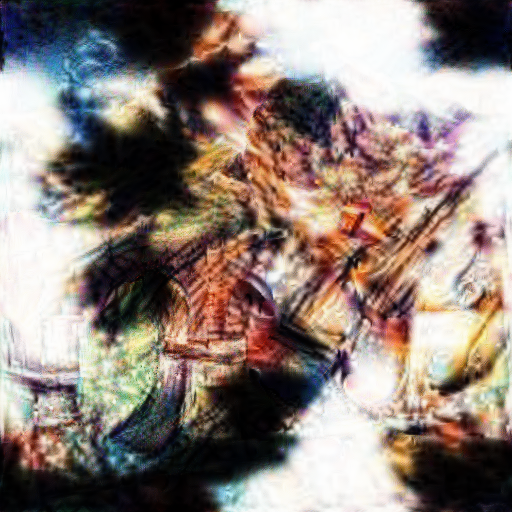

Amsterdam + The Starry Night - Van Gogh : mixed3a.png



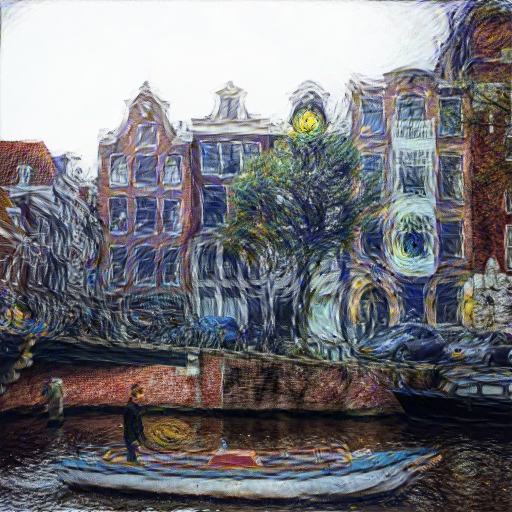

Giraffe + The Storm on the Sea of Galilee - Rembrandt : mixed4e.png



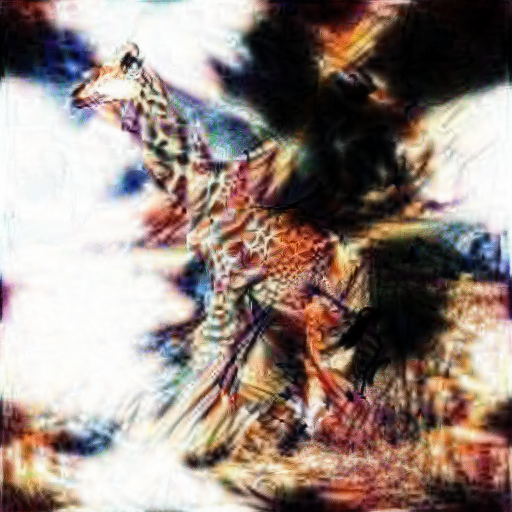

Mountain + The Starry Night - Van Gogh : mixed4a.png



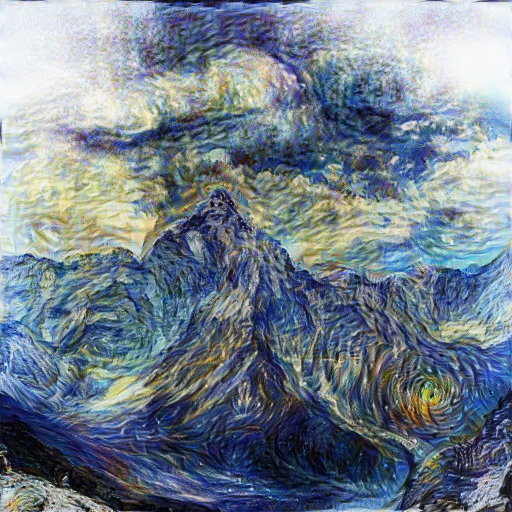

Mountain + Composition VI - Kandinsky : mixed4c.png



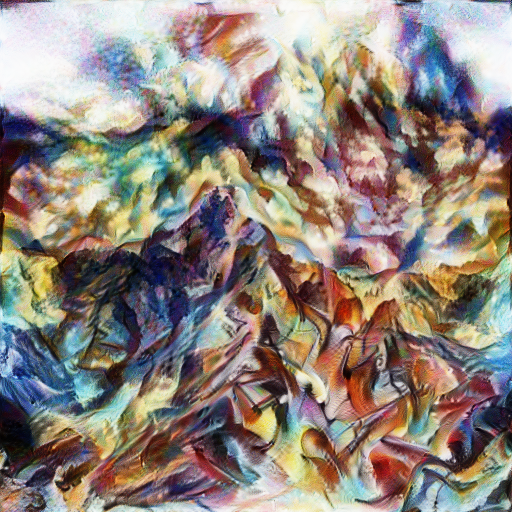

Giraffe + Composition VI - Kandinsky : mixed5b.png



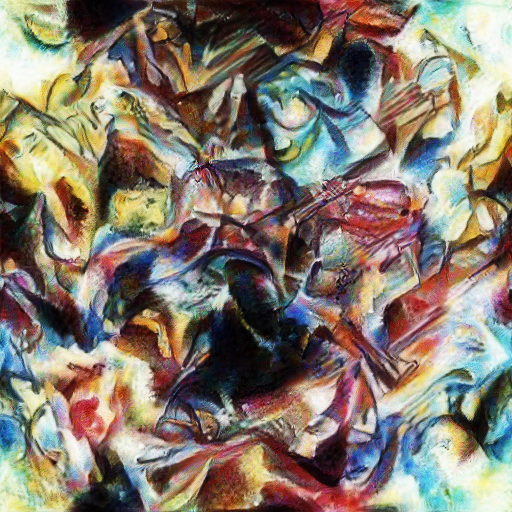

Roses + Abstract Picture - Richter : mixed3b.png



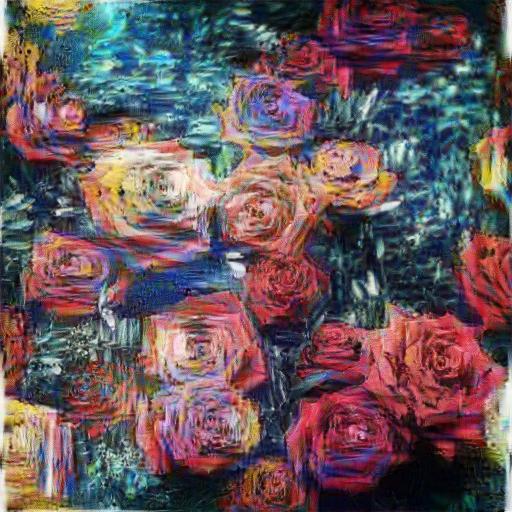

Mountain + Milliners - Picasso : mixed4e.png



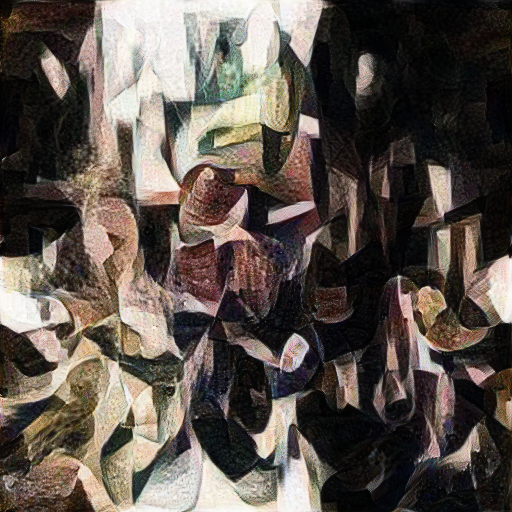

Bridge + Abstract Picture - Richter : conv2d0.png



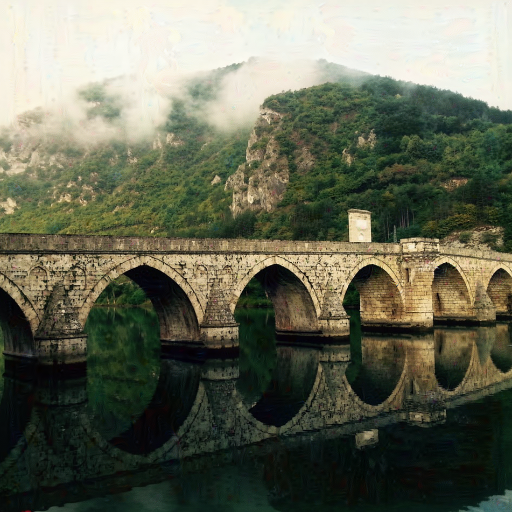

Bridge + Cubist Self-portrait - Dali : conv2d0.png



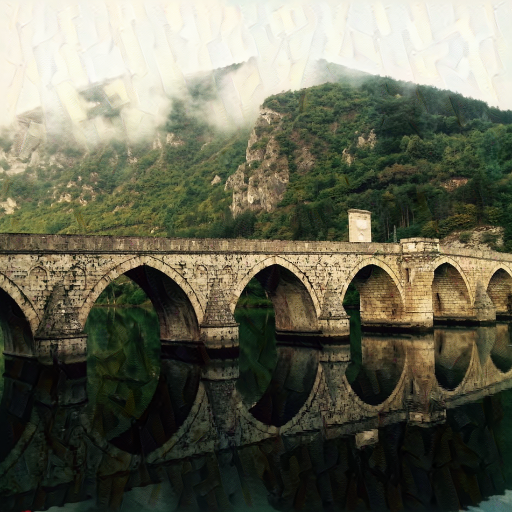

Giraffe + Cubist Self-portrait - Dali : mixed4c.png



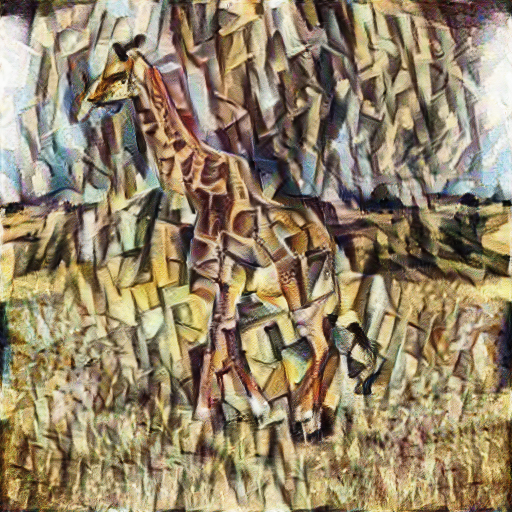

Mountain + Cubist Self-portrait - Dali : mixed3b.png



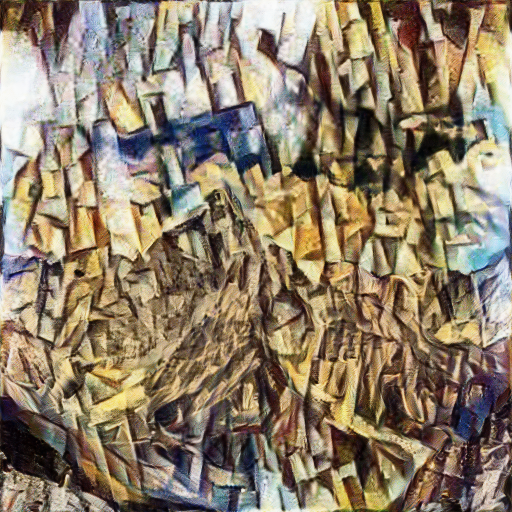

Lion + Composition VI - Kandinsky : mixed4b.png



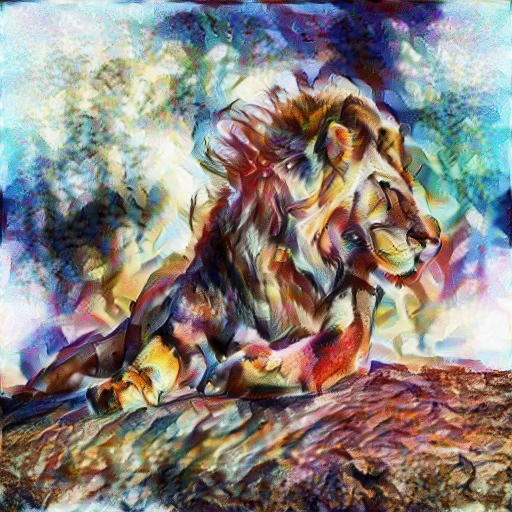

Amsterdam + Composition VI - Kandinsky : mixed4a.png



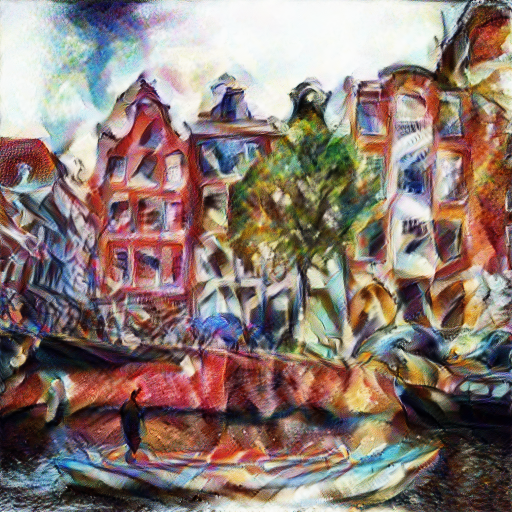

Roses + Abstract Picture - Richter : mixed5b.png



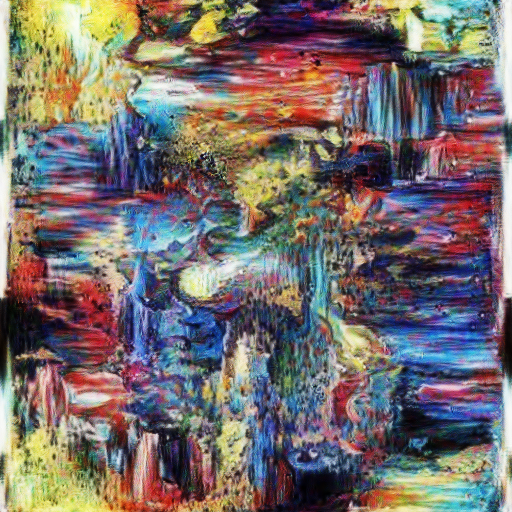

Roses + Spring - Yongyu : mixed4e.png



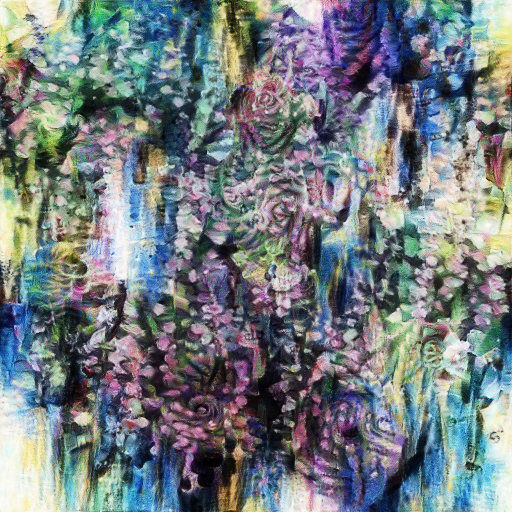

Lion + The Persistence of Memory - Dali : mixed4d.png



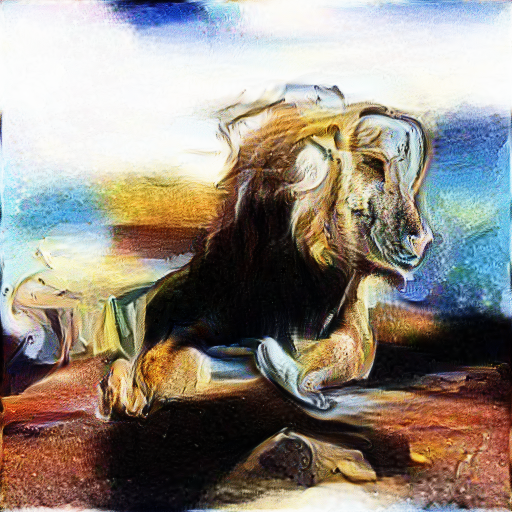

Amsterdam + Abstract Picture - Richter : conv2d2.png



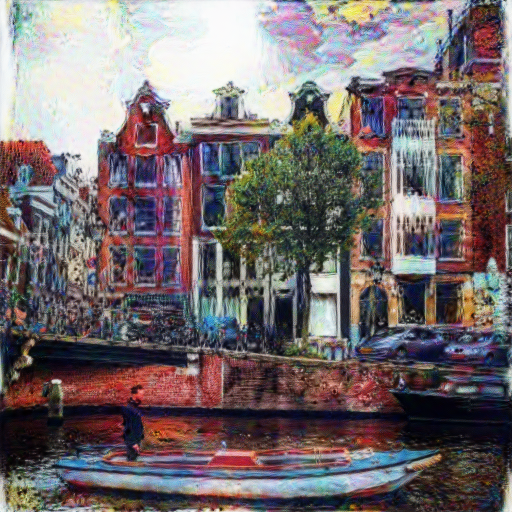

Amsterdam + The Starry Night - Van Gogh : mixed4b.png



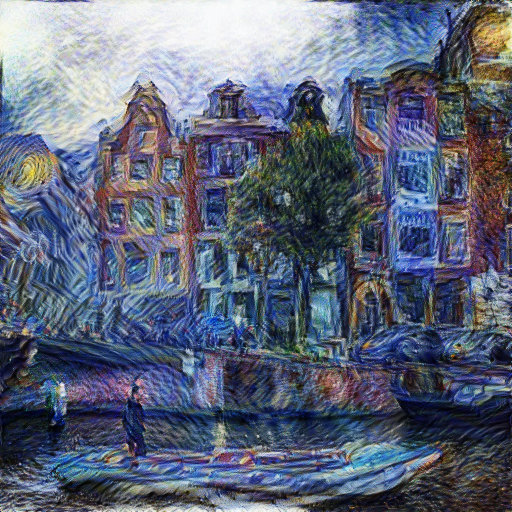

Giraffe + Abstract Picture - Richter : mixed4c.png



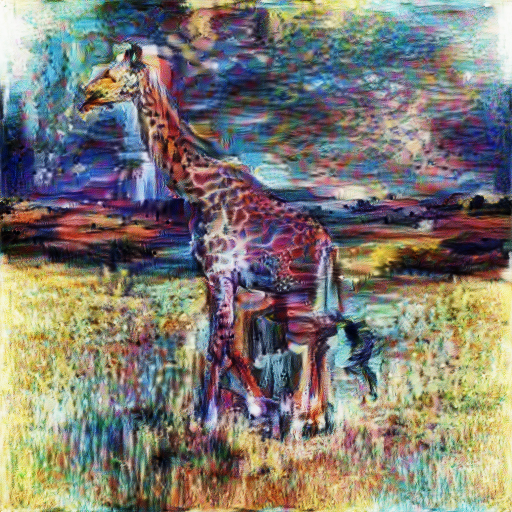

In [0]:
import random

arr = os.listdir("/gdrive/My Drive/Images")
arr.remove("combinations")

sample = random.sample(arr, 20)

for i in sample:
  print(i)
  show(load("/gdrive/My Drive/Images/" + i))